In [1]:
# imports

from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_palette('husl')
sns.set(style = "darkgrid")

from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm

from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score


### 1.	Ladda ner datasetet.

In [2]:
original_df1 = pd.read_csv("train.csv")
train_df = original_df1.copy()

original_df2 = pd.read_csv("test.csv")
test_df = original_df2.copy()

### 2.	Avgör om regression eller klassificering lämpar sig bäst för problemet att avgöra mobilpriser med hjälp av det befintliga datasetet.

In [37]:
# vi har 4 olicka typer av lables(0,1,2,3) på train_df därför vår case
# är multiclass classification

train_df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [4]:
# vi har ingen lables på test_df för att det är vi som ska predicta dem!

test_df.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,...,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1


### 3.	Gör en EDA som undersöker:

a.	Fördelningar (histogram) av features.

In [5]:
train_df.shape

(2000, 21)

In [6]:
train_df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


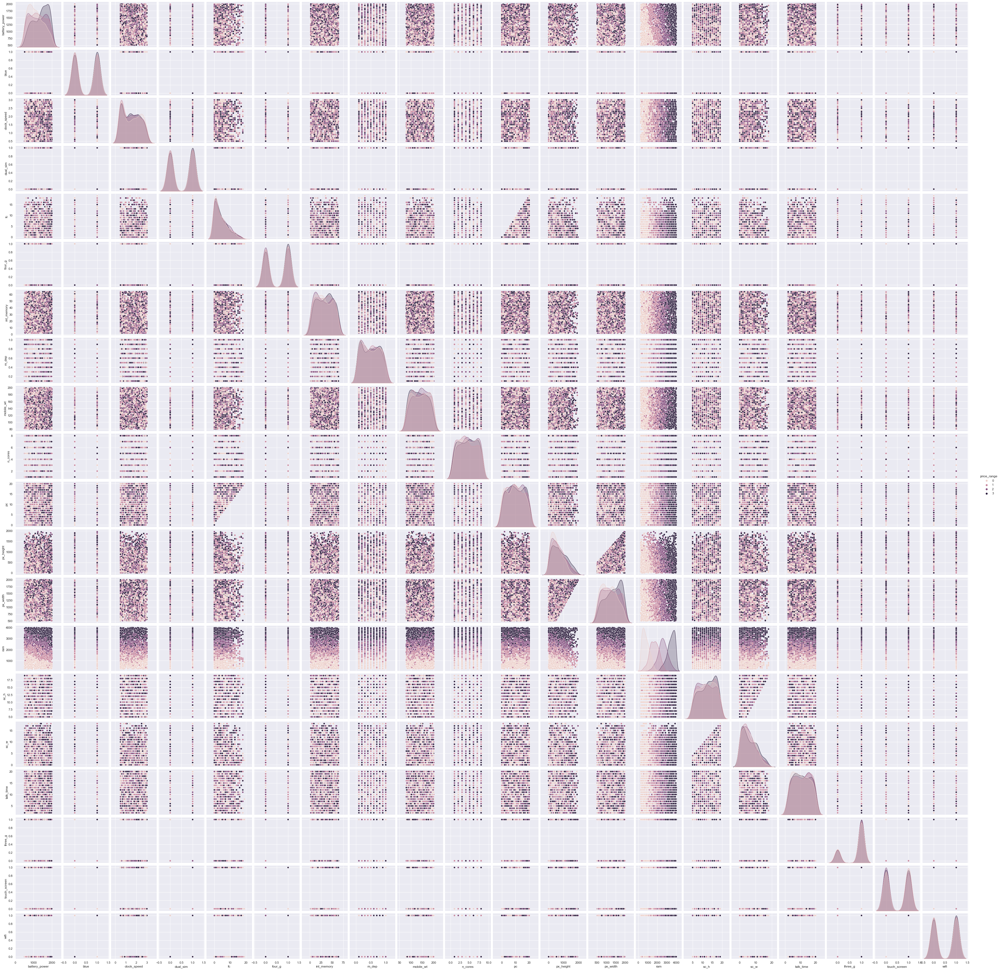

In [110]:
# det var tidlig att pairplot ge oss inte så mycket info därför tänkte vi att använda PCA 
# för att kunna för ett bättre bild av hur vår data är updelad
sns.pairplot(train_df,hue='price_range')

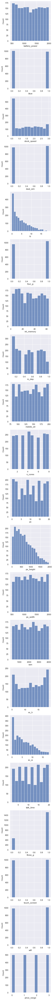

In [111]:
# Distributions
n = len(train_df.columns)
fig, axes = plt.subplots(nrows=n, figsize=(4,100))

for i, col in enumerate(train_df.columns):
        sns.histplot(train_df, x=col, ax=axes[i])

Text(0.5, 1.0, 'Label')

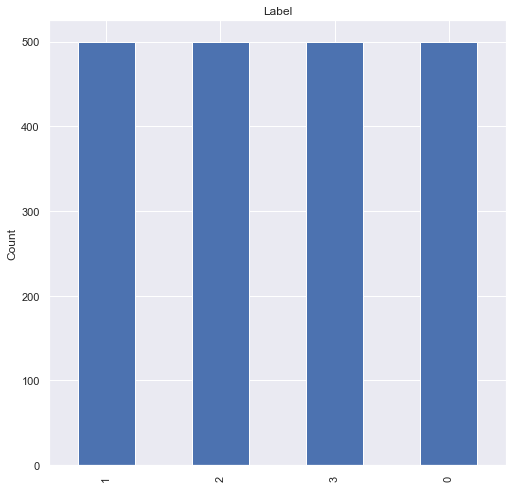

In [7]:
# Vi kollade på distributions av vår labels för att blir säkret att vi har en balance data
# och som vi se i ploten så har vi väldigt bra balancerade data och det betyder att vi kan 
# lita på accuracy för att vi vet att vår model kommer inte att bli bayes! 

fig = plt.figure(figsize=(18,18))
ax1 = fig.add_subplot(221)
train_df['price_range'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Label')

In [51]:
# dela featurs och lables från vår dataset

x=train_df.drop('price_range',axis=1)
y=train_df['price_range']

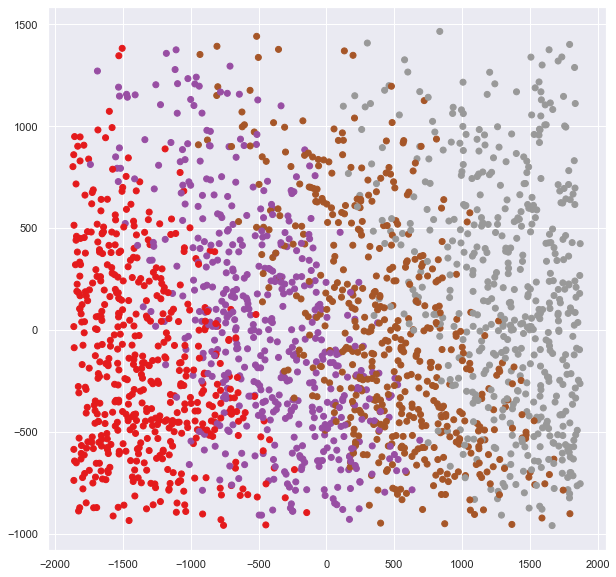

In [8]:
# PCA till data visualisation. (vi har 20 features och vi behöver går ner till 2 och 3 för att 
# kunna visualisera data hela data settet!)

pca_2 = PCA(n_components=2)
X_2_pca_train = pca_2.fit_transform(x)
fig,ax = plt.subplots(figsize=(10,10))
ax.scatter(X_2_pca_train[:,0],X_2_pca_train[:,1],c=y,cmap="Set1")
plt.show()

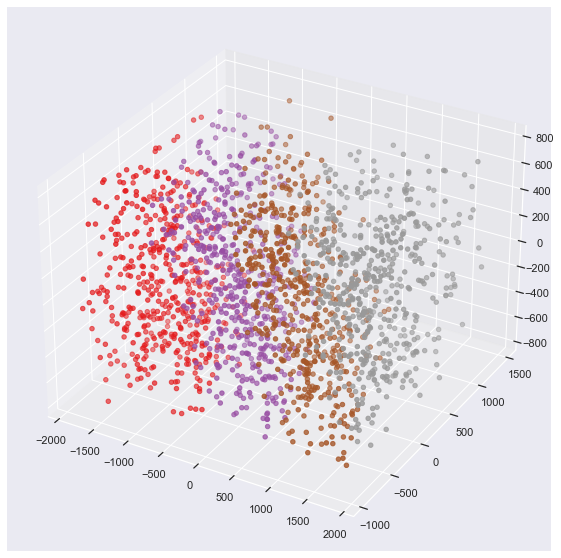

In [9]:
# på bilderna ser vi att vår data är ganska bra uppdelad men det finn en hel del överlaping 
# vilken kan gör det svårare för våra lineara modeller att predicta därför bästemde vi att 
# testa två model att börja med som vi trodde kan passar best till vår data! 
# (KNN, Logistic Regression)

pca_3 = PCA(n_components=3)
X_3_pca_train = pca_3.fit_transform(x)
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection = '3d')
ax.scatter(X_3_pca_train[:,0], X_3_pca_train[:,1], X_3_pca_train[:,2], c=y, cmap="Set1")
plt.show()

b.	Korrelation mellan features och pris.

<AxesSubplot:>

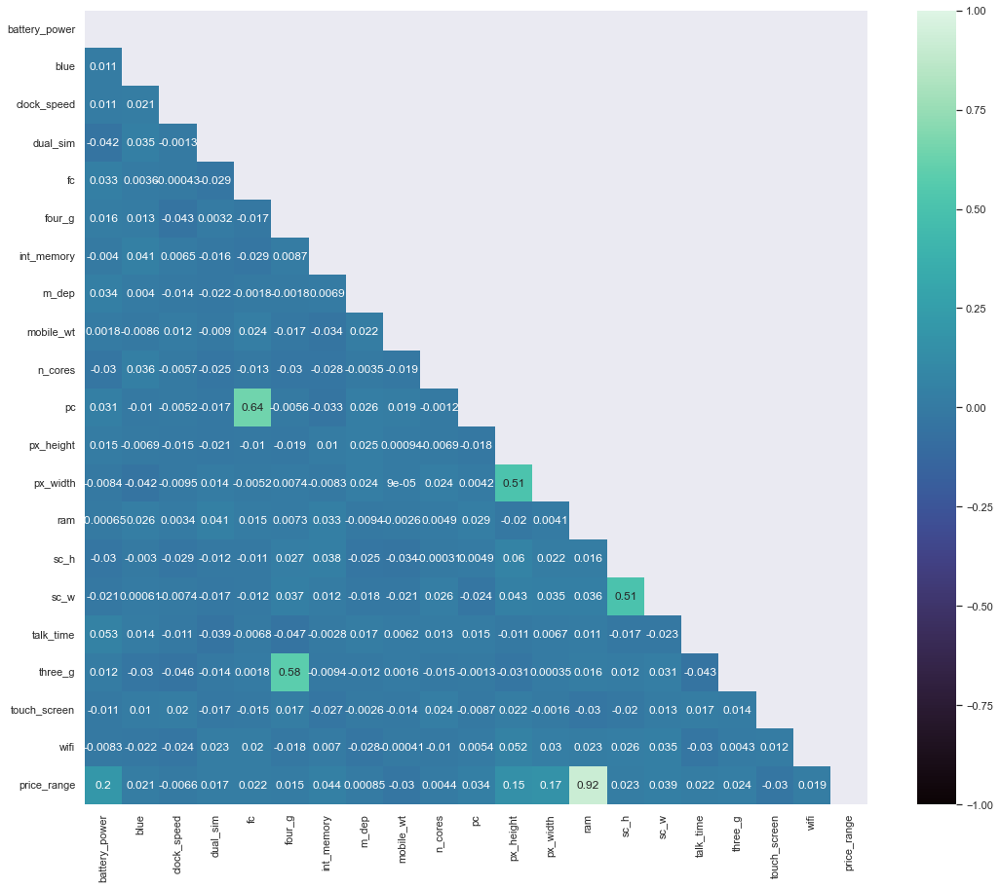

In [113]:

# vi ser redan att det finns star corelation mellan ram och price som vi borde tänka på
# samtidigt uptäkte vi att det finns stark corelation mellan visa featurs och det borde vi
# också fixa så att det går snabbare för vår model och accuracy blir bettre. 

corr = train_df.corr()
plt.figure(figsize=(18, 15))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, annot=True, cmap='mako')

In [114]:
#price range correlation
corr.sort_values(by=["price_range"],ascending=False).iloc[0].sort_values(ascending=False)

price_range      1.000000
ram              0.917046
battery_power    0.200723
px_width         0.165818
px_height        0.148858
int_memory       0.044435
sc_w             0.038711
pc               0.033599
three_g          0.023611
sc_h             0.022986
fc               0.021998
talk_time        0.021859
blue             0.020573
wifi             0.018785
dual_sim         0.017444
four_g           0.014772
n_cores          0.004399
m_dep            0.000853
clock_speed     -0.006606
mobile_wt       -0.030302
touch_screen    -0.030411
Name: price_range, dtype: float64

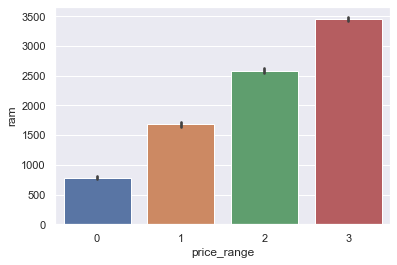

In [115]:
# det här kan man se att det finns en stark linner corellation mellan Ram och price

sns.barplot(x = 'price_range', y = 'ram',data=train_df)
plt.show()

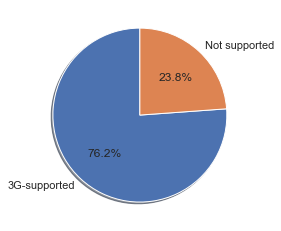

In [116]:
# lite mer information och visualisation i vår data
labels4g = ["3G-supported",'Not supported']
values4g = train_df['three_g'].value_counts().values
fig1, ax1 = plt.subplots()
ax1.pie(values4g, labels=labels4g, autopct='%1.1f%%',shadow=True,startangle=90)
plt.show()

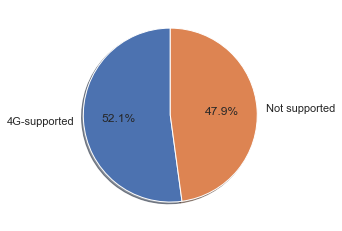

In [117]:
labels4g = ["4G-supported",'Not supported']
values4g = train_df['four_g'].value_counts().values
fig1, ax1 = plt.subplots()
ax1.pie(values4g, labels=labels4g, autopct='%1.1f%%',shadow=True,startangle=90)
plt.show()

c.	Vilka typer av features som finns.

In [118]:
# det inte finns ingen categorical värde i vår data därför behöver vi inte tänka på
# OHE för att allt är numerical. men där emot så har vi binara värde som är redan redo till oss!

train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [119]:
train_df.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [120]:
# hur många uniqe värde som finns i varje kolumn

train_df.nunique()

battery_power    1094
blue                2
clock_speed        26
dual_sim            2
fc                 20
four_g              2
int_memory         63
m_dep              10
mobile_wt         121
n_cores             8
pc                 21
px_height        1137
px_width         1109
ram              1562
sc_h               15
sc_w               19
talk_time          19
three_g             2
touch_screen        2
wifi                2
price_range         4
dtype: int64

In [121]:
# har vi nån duplicat? 

train_df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
1995    False
1996    False
1997    False
1998    False
1999    False
Length: 2000, dtype: bool

d.	Om det finns några outliers.

<AxesSubplot:>

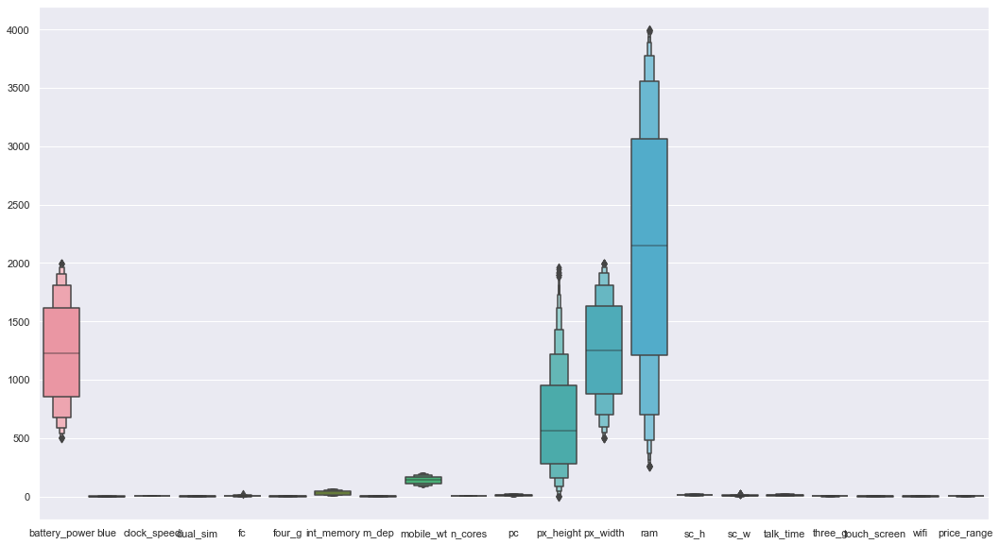

In [122]:
#leter efter outliers

plt.figure(figsize=(18, 10))
sns.boxenplot(data=train_df)

### 4.	Preprocessing

a.	Preprocessa datan utifrån vad ni upptäckt under EDA.

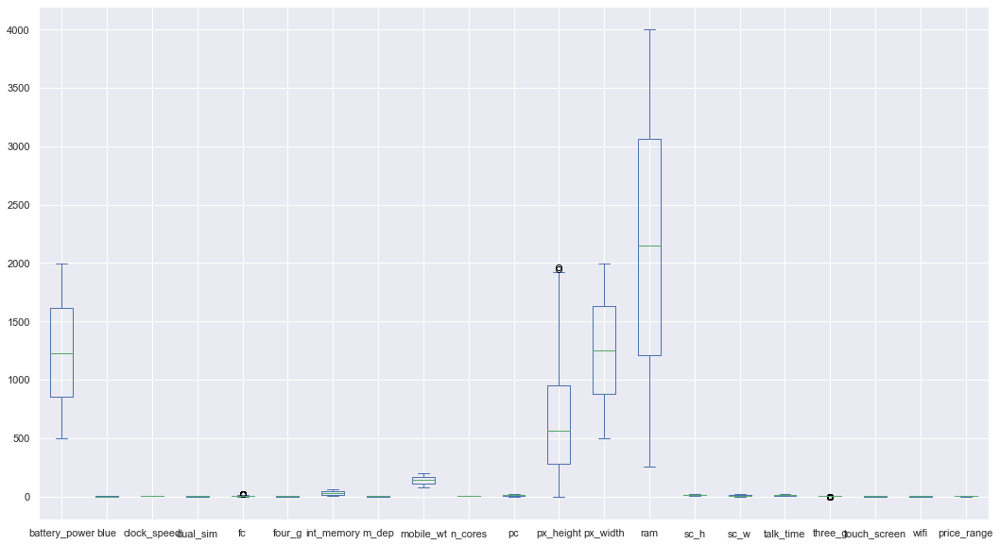

In [3]:
# outlier på ett lite tydligare sett 
train_df.plot(kind ='box' , figsize =(18,10))
plt.show()

Text(0.5, 0, 'px_height')

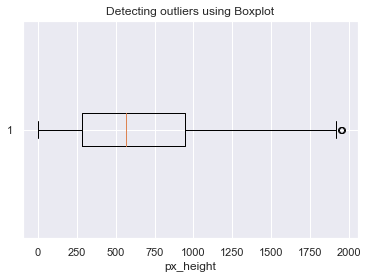

In [4]:
#mistänk outliers

plt.boxplot(train_df["px_height"], vert=False)
plt.title("Detecting outliers using Boxplot")
plt.xlabel('px_height')

In [5]:
# Det var inte så säkert att om det var en outlayers men vi bestemde oss att använda
# IQR methoden(dela datan till percentiles och varje värde utanfår lower bound och upper bound
# räknas som outlier). 

outliers = []
def detect_outliers_iqr(data):
    data = sorted(data)
    q1 = np.percentile(data, 25)
    q3 = np.percentile(data, 75)
    # print(q1, q3)
    IQR = q3-q1
    lwr_bound = q1-(1.5*IQR)
    upr_bound = q3+(1.5*IQR)
    # print(lwr_bound, upr_bound)
    for i in data: 
        if (i<lwr_bound or i>upr_bound):
            outliers.append(i)
    return outliers# Driver code
sample_outliers = detect_outliers_iqr(train_df["px_height"])
print("Outliers från IQR method: ", sample_outliers)

Outliers från IQR method:  [1949, 1960]


In [6]:
# bara för att demonstrera och testa så använde vi en annan method som heter 
# Capping and Flooring(räknar 10th, 90th percentiles och skriva om the outliers) för att ta 
# bort outliers
tenth_percentile = np.percentile(train_df["px_height"], 10)
ninetieth_percentile = np.percentile(train_df["px_height"], 90)
print(tenth_percentile, ninetieth_percentile)

125.9 1285.0


In [7]:
train_df["px_height"] = np.where(train_df["px_height"]>ninetieth_percentile, ninetieth_percentile, train_df["px_height"])
print("px_height:", train_df["px_height"])

px_height: 0         20.0
1        905.0
2       1263.0
3       1216.0
4       1208.0
         ...  
1995    1222.0
1996     915.0
1997     868.0
1998     336.0
1999     483.0
Name: px_height, Length: 2000, dtype: float64


Text(0.5, 0, 'px_height')

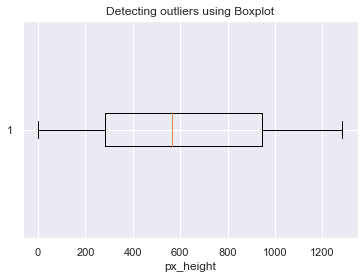

In [8]:
# ingen outlaier längre

plt.boxplot(train_df["px_height"], vert=False)
plt.title("Detecting outliers using Boxplot")
plt.xlabel('px_height')

In [9]:
# ta bort unödiga kolumner som vi uptäkte från ECA undersökning
# PC och FC har en stark correlation så vi bestemde att använda bara en av dem. 

new_train_df = train_df.drop(["fc"], axis=1)
new_train_df

,battery_power,blue,clock_speed,dual_sim,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,0,7,0.6,188,2,2,20.0,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,1,53,0.7,136,3,6,905.0,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,1,41,0.9,145,5,6,1263.0,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,10,0.8,131,6,9,1216.0,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,1,44,0.6,141,2,14,1208.0,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,1,2,0.8,106,6,14,1222.0,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,39,0.2,187,4,3,915.0,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,36,0.7,108,8,3,868.0,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,1,46,0.1,145,5,5,336.0,670,869,18,10,19,1,1,1,0


<AxesSubplot:>

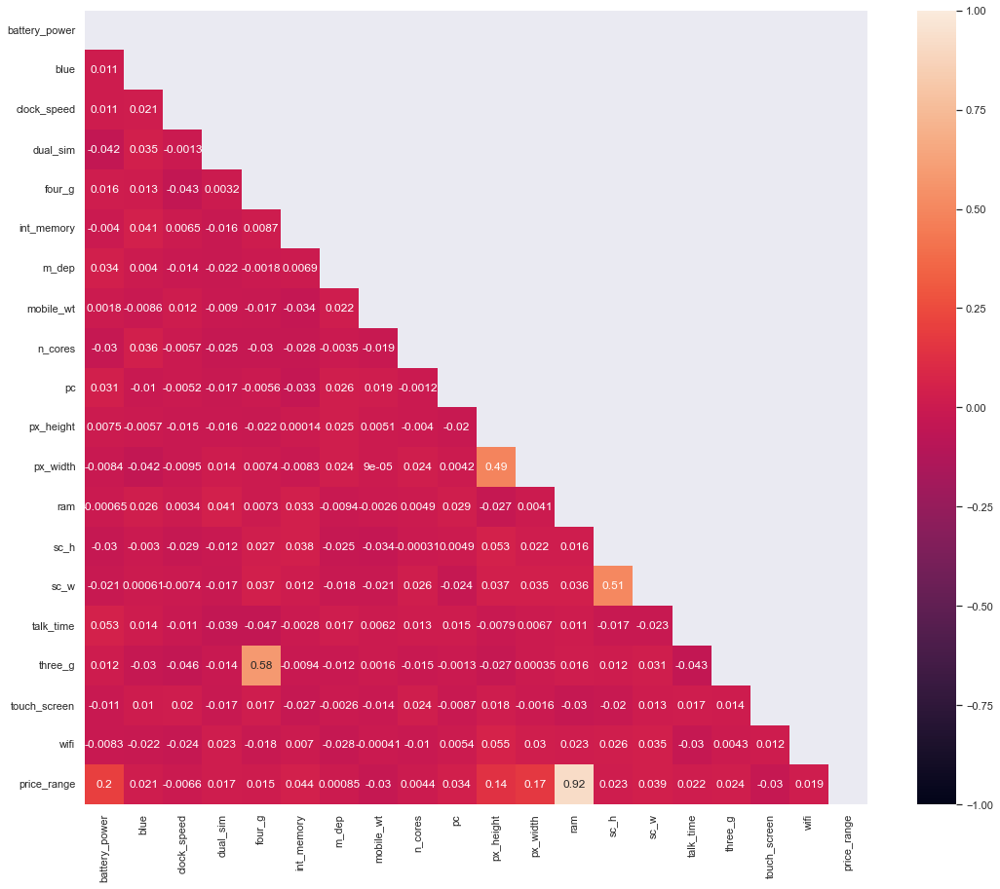

In [131]:
# det ser bettre nu! :)
corr = new_train_df.corr()
plt.figure(figsize=(18,15))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, vmin=-1, vmax=1,mask=mask, annot=True)

In [132]:
new_train_df.var()

battery_power    1.930884e+05
blue             2.501001e-01
clock_speed      6.658629e-01
dual_sim         2.500348e-01
four_g           2.496626e-01
int_memory       3.292670e+02
m_dep            8.318353e-02
mobile_wt        1.253136e+03
n_cores          5.234197e+00
pc               3.677592e+01
px_height        1.563094e+05
px_width         1.867964e+05
ram              1.176644e+06
sc_h             1.775143e+01
sc_w             1.897820e+01
talk_time        2.985481e+01
three_g          1.817086e-01
touch_screen     2.501161e-01
wifi             2.500760e-01
price_range      1.250625e+00
dtype: float64

### 5.	Ta fram en maskininlärningsmodell med hög test-accuracy.

a.	Använd data-centriska metoder. Testa minst 5 olika metoder.

In [10]:
# dela featurs och lables från vår dataset

x=new_train_df.drop('price_range',axis=1)
y=new_train_df['price_range']

# Dela upp dataset
X_reduced, X_test, y_reduced, y_test = train_test_split(x,y,test_size=0.2,train_size=0.8, random_state=3)
X_train, X_val, y_train, y_val = train_test_split(X_reduced,y_reduced,test_size = 0.25,train_size =0.75, random_state=3)
print(X_train.shape)
print(X_val.shape)
print(X_test.shape)
print(y_train.shape)
print(y_val.shape)
print(y_test.shape)


(1200, 19)
(400, 19)
(400, 19)
(1200,)
(400,)
(400,)


In [16]:
X_train.head()

,battery_power,blue,clock_speed,dual_sim,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
367,825,0,2.9,1,0,34,0.8,99,8,17,1285.0,1866,2915,8,2,10,1,1,0
1736,1779,1,2.6,1,0,5,0.8,90,1,3,1225.0,1717,1246,12,2,20,0,1,0
1485,742,1,2.3,0,0,21,0.7,104,8,1,875.0,925,331,11,8,7,1,0,0
195,1526,0,2.1,0,1,23,0.2,117,7,8,718.0,751,2227,18,10,3,1,1,0
1674,1945,0,1.2,0,0,26,0.7,112,6,5,1064.0,1540,3322,18,7,20,0,0,1


In [19]:
# vi ville testa de två utvalda modeller först utan nån data centrica methoder

knn = KNeighborsClassifier(n_neighbors=18)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_val)
print(metrics.classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97       115
           1       0.90      0.91      0.91        94
           2       0.89      0.85      0.87        97
           3       0.93      0.94      0.93        94

    accuracy                           0.92       400
   macro avg       0.92      0.92      0.92       400
weighted avg       0.92      0.92      0.92       400



<AxesSubplot:>

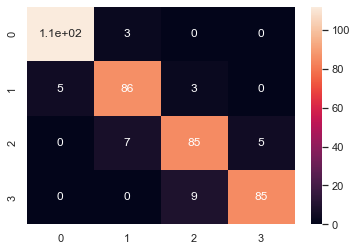

In [18]:
sns.heatmap(metrics.confusion_matrix(y_val,y_pred), annot=True)

In [13]:
# Elbow Method till optimum k värde ! (bara info)

error_rate = []
for i in range(1,20):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

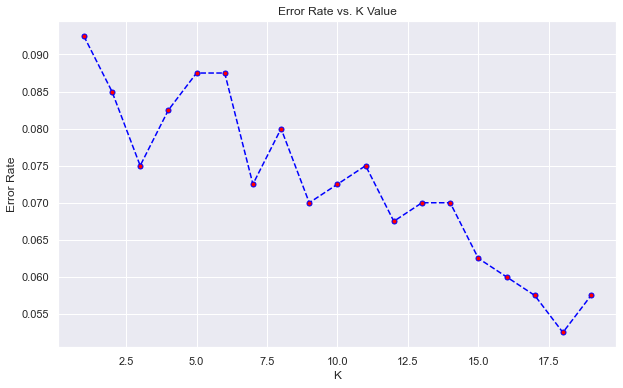

In [14]:
plt.figure(figsize=(10,6))
plt.plot(range(1,20),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=5)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [19]:
# OBS! vi testade LogisticRegression utan nån data centrica methoder(ingen scalning)
# vi ville test vår andra utvalda model vilket var LogisticRegression
# inte bra resoltat i första försöket men...

log= LogisticRegression()
log.fit(X_train, y_train)
y_pred = log.predict(X_val)
print(metrics.classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.83      0.82      0.82       115
           1       0.50      0.51      0.51        94
           2       0.51      0.45      0.48        97
           3       0.65      0.72      0.68        94

    accuracy                           0.64       400
   macro avg       0.62      0.63      0.62       400
weighted avg       0.63      0.64      0.63       400



C:\Users\dadme\anaconda3\envs\ml\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


<AxesSubplot:>

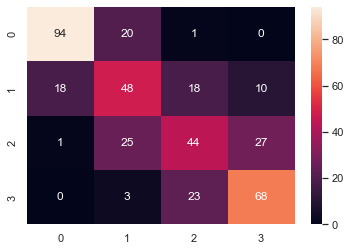

In [20]:
sns.heatmap(metrics.confusion_matrix(y_val,y_pred), annot=True)

### scaling:

In [157]:
# vi ville inte våra binera värde också blir skalade (hade andra alternativer 
# till example droppa dem )
scaler = RobustScaler()
scaler.fit(X_train)
X_scale_train = scaler.transform(X_train)
X_scale_val = scaler.transform(X_val)
scaled_data_train = pd.DataFrame(X_scale_train, columns=X_train.columns, index=X_train.index)
scaled_data_train.head()

,battery_power,blue,clock_speed,dual_sim,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
367,-0.534937,0.0,0.933333,0.0,-1.0,0.09375,0.500000,-0.677419,0.75,0.7,1.084408,0.822944,0.398642,-0.571429,-0.428571,-0.1,0.0,0.0,-1.0
1736,0.705232,1.0,0.733333,0.0,-1.0,-0.81250,0.500000,-0.822581,-1.00,-0.7,0.995945,0.625332,-0.507807,0.000000,-0.428571,0.9,-1.0,0.0,-1.0
1485,-0.642834,1.0,0.533333,-1.0,-1.0,-0.31250,0.333333,-0.596774,0.75,-0.9,0.479912,-0.425066,-1.004752,-0.142857,0.428571,-0.4,0.0,-1.0,-1.0
195,0.376341,0.0,0.400000,-1.0,0.0,-0.25000,-0.500000,-0.387097,0.50,-0.2,0.248433,-0.655836,0.024983,0.857143,0.714286,-0.8,0.0,0.0,-1.0
1674,0.921027,0.0,-0.200000,-1.0,-1.0,-0.15625,0.333333,-0.467742,0.25,-0.5,0.758570,0.390584,0.619688,0.857143,0.285714,0.9,-1.0,-1.0,0.0


In [151]:

scaler = StandardScaler()
scaler.fit(X_train)
X_scale_train = scaler.transform(X_train)
X_scale_val = scaler.transform(X_val)
scaled_data_train = pd.DataFrame(X_scale_train, columns=X_train.columns, index=X_train.index)
scaled_data_train.head()

,battery_power,blue,clock_speed,dual_sim,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
367,-0.956594,-0.959166,1.700196,0.957566,-1.025320,0.129108,1.040126,-1.151967,1.519974,1.182431,1.700266,1.448433,0.718125,-1.012104,-0.844496,-0.175146,0.564519,0.993355,-1.037364
1736,1.210728,1.042572,1.332210,0.957566,-1.025320,-1.469807,1.040126,-1.405358,-1.579003,-1.126360,1.548776,1.103485,-0.831416,-0.062329,-0.844496,1.650875,-1.771421,0.993355,-1.037364
1485,-1.145155,1.042572,0.964225,-1.044314,-1.025320,-0.587647,0.697885,-1.011194,1.519974,-1.456187,0.665086,-0.730065,-1.680925,-0.299773,0.538035,-0.722952,0.564519,-1.006689,-1.037364
195,0.635956,-0.959166,0.718901,-1.044314,0.975305,-0.477377,-1.013317,-0.645185,1.077263,-0.301792,0.268688,-1.132891,0.079369,1.362334,0.998879,-1.453360,0.564519,0.993355,-1.037364
1674,1.587851,-0.959166,-0.385056,-1.044314,-1.025320,-0.311972,0.697885,-0.785958,0.634552,-0.796533,1.142279,0.693714,1.095994,1.362334,0.307613,1.650875,-1.771421,-1.006689,0.963982


In [58]:
# våra binera värde är fortfarande 0 och 1 men de påvärkade vår minmax scalningen och därför
# kan vi inte leta på vår dataset längre

scaler = MinMaxScaler()
scaler.fit(X_train)
X_scale_train = scaler.transform(X_train)
X_scale_val = scaler.transform(X_val)
scaled_data_train = pd.DataFrame(X_scale_train, columns=X_train.columns, index=X_train.index)
scaled_data_train.head()

,battery_power,blue,clock_speed,dual_sim,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
367,0.216433,0.0,0.96,1.0,0.0,0.516129,0.777778,0.158333,1.000000,0.85,1.000000,0.911883,0.710428,0.214286,0.111111,0.444444,1.0,1.0,0.0
1736,0.853707,1.0,0.84,1.0,0.0,0.048387,0.777778,0.083333,0.000000,0.15,0.953307,0.812417,0.264171,0.500000,0.111111,1.000000,0.0,1.0,0.0
1485,0.160989,1.0,0.72,0.0,0.0,0.306452,0.666667,0.200000,1.000000,0.05,0.680934,0.283712,0.019519,0.428571,0.444444,0.277778,1.0,0.0,0.0
195,0.684703,0.0,0.64,0.0,1.0,0.338710,0.111111,0.308333,0.857143,0.40,0.558755,0.167557,0.526471,0.928571,0.555556,0.055556,1.0,1.0,0.0
1674,0.964596,0.0,0.28,0.0,0.0,0.387097,0.666667,0.266667,0.714286,0.25,0.828016,0.694259,0.819251,0.928571,0.388889,1.000000,0.0,0.0,1.0


In [44]:
# vi vill inte våra binera värde påverka vår data på fel sett

x_raw1 = new_train_df[['blue', 'dual_sim', 'four_g', 'three_g','touch_screen', 'wifi']]
x_raw2 = new_train_df.drop(columns=['blue', 'dual_sim', 'four_g', 'three_g','touch_screen', 'wifi', 'price_range']).values
scaler = StandardScaler().fit_transform(x_raw2)

In [45]:
# efter scalningen vi läga till våra binera värde igen i vår dataset
x1 = np.concatenate([scaler, x_raw1], axis=1)

In [46]:
scaled_data_train = pd.DataFrame(x1)
scaled_data_train.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,-0.902597,0.830779,-1.380644,0.340740,1.349249,-1.101971,-1.305750,-1.520193,-1.146784,0.391703,-0.784983,0.283103,1.462493,0.0,0.0,0.0,0.0,0.0,1.0
1,-0.495139,-1.253064,1.155024,0.687548,-0.120059,-0.664768,-0.645989,0.718834,1.704465,0.467317,1.114266,-0.635317,-0.734267,1.0,1.0,1.0,1.0,1.0,0.0
2,-1.537686,-1.253064,0.493546,1.381165,0.134244,0.209639,-0.645989,1.624564,1.074968,0.441498,-0.310171,-0.864922,-0.368140,1.0,1.0,1.0,1.0,1.0,0.0
3,-1.419319,1.198517,-1.215274,1.034357,-0.261339,0.646842,-0.151168,1.505656,1.236971,0.594569,0.876859,0.512708,-0.002014,1.0,0.0,0.0,1.0,0.0,0.0
4,1.325906,-0.395011,0.658915,0.340740,0.021220,-1.101971,0.673534,1.485416,-0.091452,-0.657666,-1.022389,-0.864922,0.730240,1.0,0.0,1.0,1.0,1.0,0.0


In [26]:
scaled_data_train.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
count,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2.000000e+03,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,2.128298e-16,-2.172151e-16,-8.754109e-17,-1.045830e-16,1.804112e-16,-4.690692e-17,1.669775e-16,-1.547651e-16,5.595524e-17,-1.582068e-16,3.719247e-17,-4.085621e-17,1.052491e-16,0.4950,0.509500,0.521500,0.761500,0.503000,0.507000
std,1.000250e+00,1.000250e+00,1.000250e+00,1.000250e+00,1.000250e+00,1.000250e+00,1.000250e+00,1.000250e+00,1.000250e+00,1.000250e+00,1.000250e+00,1.000250e+00,1.000250e+00,0.5001,0.500035,0.499662,0.426273,0.500116,0.500076
min,-1.678817e+00,-1.253064e+00,-1.656260e+00,-1.393304e+00,-1.702391e+00,-1.539175e+00,-1.635631e+00,-1.570792e+00,-1.739251e+00,-1.722711e+00,-1.734608e+00,-1.324131e+00,-1.649584e+00,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-8.804033e-01,-1.007906e+00,-8.845346e-01,-1.046495e+00,-8.829695e-01,-6.647678e-01,-8.109291e-01,-8.554423e-01,-8.719579e-01,-8.453168e-01,-7.849833e-01,-8.649215e-01,-9.173306e-01,0.0000,0.000000,0.000000,1.000000,0.000000,0.000000
50%,-2.849593e-02,-2.727384e-02,-2.563229e-03,-6.069151e-03,2.122020e-02,-2.275644e-01,1.377252e-02,-1.438872e-01,-1.045034e-02,2.055123e-02,-7.276497e-02,-1.761069e-01,-2.013697e-03,0.0000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,8.575560e-01,8.307794e-01,8.794082e-01,1.034357e+00,8.406421e-01,1.084046e+00,8.384742e-01,8.257253e-01,8.828792e-01,8.670548e-01,8.768595e-01,7.423125e-01,9.133032e-01,1.0000,1.000000,1.000000,1.000000,1.000000,1.000000
max,1.728812e+00,1.811412e+00,1.761380e+00,1.727974e+00,1.688320e+00,1.521249e+00,1.663176e+00,1.680224e+00,1.727608e+00,1.727851e+00,1.589078e+00,2.808756e+00,1.645557e+00,1.0000,1.000000,1.000000,1.000000,1.000000,1.000000


In [59]:
# vi uptekte att scalningen hjälpte inte vår KNN model och det kan bror på att efter skalningen
# punkterna kommer så nära varandra och det kan gör det svarare för KNN att predicta rätt. 
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_scale_train, y_train)
y_pred = knn.predict(X_scale_val)
print(metrics.classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.59      0.52      0.56       115
           1       0.30      0.39      0.34        94
           2       0.32      0.37      0.34        97
           3       0.66      0.45      0.53        94

    accuracy                           0.44       400
   macro avg       0.47      0.43      0.44       400
weighted avg       0.47      0.44      0.45       400



In [29]:
# LogisticRegression med scalade data levererade betydlig bettre!

log = LogisticRegression()
log.fit(X_train, y_train)
y_pred = log.predict(X_val)
print(metrics.classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       115
           1       0.95      0.97      0.96        94
           2       0.96      0.92      0.94        97
           3       0.95      0.97      0.96        94

    accuracy                           0.96       400
   macro avg       0.96      0.96      0.96       400
weighted avg       0.96      0.96      0.96       400



<AxesSubplot:>

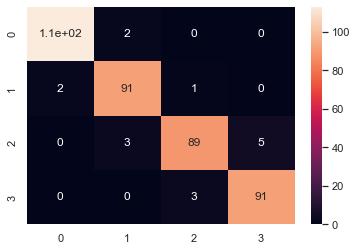

In [30]:
sns.heatmap(metrics.confusion_matrix(y_val,y_pred), annot=True)

### Binärt:

In [167]:
# binärt hjälpte inte! resultaten försämras för att vi förlura mycket införmation
X_binary_train = np.zeros(X_train.shape)
X_binary_train[X_train>1/2] = 1
X_binary_val = np.zeros(X_val.shape)
X_binary_val[X_val>1/2] = 1

log = LogisticRegression()
log.fit(X_binary_train, y_train)
y_pred = log.predict(X_binary_val)
print(metrics.classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.30      0.05      0.09       115
           1       0.00      0.00      0.00        94
           2       0.26      0.67      0.37        97
           3       0.29      0.40      0.34        94

    accuracy                           0.27       400
   macro avg       0.21      0.28      0.20       400
weighted avg       0.22      0.27      0.20       400



C:\Users\dadme\anaconda3\envs\ml\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dadme\anaconda3\envs\ml\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dadme\anaconda3\envs\ml\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Ändrar antalet träningsexempel

In [171]:
# vi använde hela datasetet och kunde inte öka antal tränings data därför tänkte vi att minska 
# och resoltatet var presis som vi alla vet. försämrades. 
X_decrease_train = x.iloc[200:,:]
y_decrease_train = y.iloc[200:].astype(np.uint8)

log = LogisticRegression()
log.fit(X_decrease_train, y_decrease_train)
y_pred = log.predict(X_val)
print(metrics.classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.83      0.81      0.82       115
           1       0.50      0.54      0.52        94
           2       0.51      0.42      0.46        97
           3       0.64      0.71      0.67        94

    accuracy                           0.63       400
   macro avg       0.62      0.62      0.62       400
weighted avg       0.63      0.63      0.63       400



C:\Users\dadme\anaconda3\envs\ml\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


### Variera antalet träningsexempel för klasser

In [173]:
# resoltaten försämras
x=new_train_df.drop('price_range',axis=1)
y=new_train_df['price_range']

# Dela upp dataset
X_reduced, X_test, y_reduced, y_test = train_test_split(x,y,test_size=0.3,train_size=0.7, random_state=3)
X_train, X_val, y_train, y_val = train_test_split(X_reduced,y_reduced,test_size = 0.35,train_size =0.65, random_state=3)
print(X_train.shape)
print(X_val.shape)
print(X_test.shape)
print(y_train.shape)
print(y_val.shape)
print(y_test.shape)

(910, 19)
(490, 19)
(600, 19)
(910,)
(490,)
(600,)


In [174]:
scaler = MinMaxScaler()
scaler.fit(X_train)
X_scale_train = scaler.transform(X_train)
X_scale_val = scaler.transform(X_val)
log = LogisticRegression()
log.fit(X_scale_train, y_train)
y_pred = log.predict(X_scale_val)
print(metrics.classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.95      0.90      0.92       129
           1       0.82      0.82      0.82       114
           2       0.83      0.83      0.83       114
           3       0.92      0.95      0.94       133

    accuracy                           0.88       490
   macro avg       0.88      0.88      0.88       490
weighted avg       0.88      0.88      0.88       490



In [175]:
x=new_train_df.drop('price_range',axis=1)
y=new_train_df['price_range']

# Dela upp dataset
X_reduced, X_test, y_reduced, y_test = train_test_split(x,y,test_size=0.1,train_size=0.9, random_state=3)
X_train, X_val, y_train, y_val = train_test_split(X_reduced,y_reduced,test_size = 0.15,train_size =0.85, random_state=3)
print(X_train.shape)
print(X_val.shape)
print(X_test.shape)
print(y_train.shape)
print(y_val.shape)
print(y_test.shape)

(1530, 19)
(270, 19)
(200, 19)
(1530,)
(270,)
(200,)


In [176]:
scaler = MinMaxScaler()
scaler.fit(X_train)
X_scale_train = scaler.transform(X_train)
X_scale_val = scaler.transform(X_val)
log = LogisticRegression()
log.fit(X_scale_train, y_train)
y_pred = log.predict(X_scale_val)
print(metrics.classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94        57
           1       0.92      0.84      0.88        77
           2       0.91      0.86      0.89        73
           3       0.93      1.00      0.96        63

    accuracy                           0.91       270
   macro avg       0.91      0.92      0.92       270
weighted avg       0.91      0.91      0.91       270



### dimensionsreducerad data

In [184]:
# vi testade PCA men resoltaten försemrades
pca3 = PCA(n_components=3)
X_3_pca_train = pca_3.fit_transform(X_scale_train)
log = LogisticRegression()
log.fit(X_3_pca_train, y_train)
X_3_pca_val = pca_3.transform(X_val)
y_pred = log.predict(X_3_pca_val)
print(metrics.classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.82      0.25      0.38        57
           1       0.42      0.44      0.43        77
           2       0.08      0.01      0.02        73
           3       0.39      1.00      0.56        63

    accuracy                           0.41       270
   macro avg       0.43      0.43      0.35       270
weighted avg       0.41      0.41      0.34       270



C:\Users\dadme\anaconda3\envs\ml\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


### Model-centric approach

### KNN

In [191]:
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_val)
print(metrics.classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94        57
           1       0.92      0.87      0.89        77
           2       0.89      0.92      0.91        73
           3       0.98      0.94      0.96        63

    accuracy                           0.92       270
   macro avg       0.92      0.93      0.92       270
weighted avg       0.92      0.92      0.92       270



<AxesSubplot:>

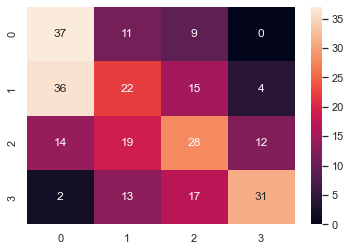

In [188]:
sns.heatmap(metrics.confusion_matrix(y_val,y_pred), annot=True)

### SVM

In [190]:
clf = svm.SVC()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_val)
print(metrics.classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.93      0.96      0.95        57
           1       0.91      0.95      0.93        77
           2       0.97      0.86      0.91        73
           3       0.92      0.97      0.95        63

    accuracy                           0.93       270
   macro avg       0.93      0.94      0.93       270
weighted avg       0.93      0.93      0.93       270



<AxesSubplot:>

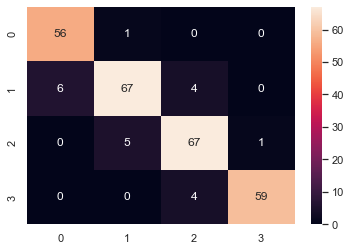

In [192]:
sns.heatmap(metrics.confusion_matrix(y_val,y_pred), annot=True)

### Decisiontree

In [198]:
clf = DecisionTreeClassifier(random_state=0)
clf.fit(X_scale_train, y_train)
y_pred = clf.predict(X_scale_val)

In [199]:
print(metrics.classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.86      0.84      0.85        57
           1       0.78      0.75      0.77        77
           2       0.76      0.77      0.76        73
           3       0.85      0.89      0.87        63

    accuracy                           0.81       270
   macro avg       0.81      0.81      0.81       270
weighted avg       0.81      0.81      0.81       270



<AxesSubplot:>

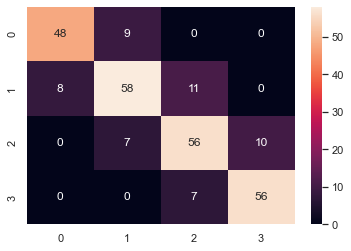

In [200]:
sns.heatmap(metrics.confusion_matrix(y_val,y_pred), annot=True)

### Random forest

In [196]:
clf = RandomForestClassifier(max_depth=10, random_state=0)
clf.fit(X_scale_train, y_train)
y_pred = clf.predict(X_scale_val)
print(metrics.classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.87      0.95      0.91        57
           1       0.82      0.78      0.80        77
           2       0.81      0.74      0.77        73
           3       0.87      0.94      0.90        63

    accuracy                           0.84       270
   macro avg       0.84      0.85      0.84       270
weighted avg       0.84      0.84      0.84       270



<AxesSubplot:>

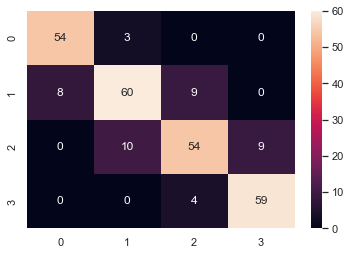

In [197]:
sns.heatmap(metrics.confusion_matrix(y_val,y_pred), annot=True)

### Naive Bayes

In [201]:
gnb = GaussianNB()
clf.fit(X_scale_train, y_train)
y_pred = clf.predict(X_scale_val)
print(metrics.classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.86      0.84      0.85        57
           1       0.78      0.75      0.77        77
           2       0.76      0.77      0.76        73
           3       0.85      0.89      0.87        63

    accuracy                           0.81       270
   macro avg       0.81      0.81      0.81       270
weighted avg       0.81      0.81      0.81       270



<AxesSubplot:>

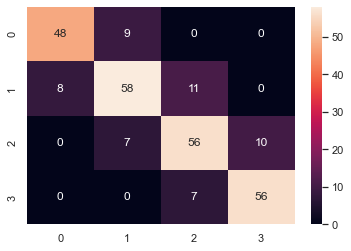

In [202]:
sns.heatmap(metrics.confusion_matrix(y_val,y_pred), annot=True)

### Golden model LogisticRegression!!! 

## K fold cross validation

In [ ]:
# använda k fold för att splita vår data och hitta den bästa resoltaten
kf = KFold(n_splits=10, shuffle=True)

splits = kf.split(x, y) # Returnerar index


metrics = []
scores = []
for split in splits:
    train_idx, test_idx = split

    # Plocka ut träning och testset
    X_train, X_test = x[train_idx, :], x[test_idx, :]
    Y_train, Y_test = y[train_idx, :], y[test_idx, :]

    # Träna modell
    clf = DecisionTreeClassifier().fit(X_train, Y_train)
    y_pred = clf.predict(X_test)

    # Beräkna metric
    metric = classification_report(Y_test, y_pred)
    metrics.append(metric)
    #Beräkna score
    score = accuracy_score(Y_test, y_pred)
    scores.append(score)


In [ ]:
# As we see model 6 has the best accuracy 
print(scores[:10])

### nu är dags att predicta test data set. 

In [237]:
original_df2 = pd.read_csv("test.csv")
test_df = original_df2.copy()

In [240]:
#dropa id column föratt vi behöver inte det

new_test_data = test_df.drop(columns=['id', 'fc']).values
new_test_data.shape

(1000, 19)

In [241]:
#scalning

scaler = MinMaxScaler()
scaler.fit(new_test_data)
X_scale = scaler.transform(new_test_data)

In [242]:
# Predict

y2_pred = log.predict(X_scale)

In [243]:
# lägga till våra predicta värder i vår dataset
test_df['predicted_price_range']=y2_pred

In [246]:
def gradify(row, column_name):
    price = row[column_name]
    if price == 0.00:
        return 'cheap'
    elif price == 1.00:
        return 'medium price'
    elif price == 2.00:
        return 'expensive'
    else:
        return 'very expensive'
test_df['price_cat'] =test_df.apply(lambda row: gradify(row, 'predicted_price_range'), axis=1)
new_df = test_df.drop(columns=['predicted_price_range'])
new_df.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_cat
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,226,1412,3476,12,7,2,0,1,0,very expensive
1,2,841,1,0.5,1,4,1,61,0.8,191,...,746,857,3895,6,0,7,1,0,0,very expensive
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,1270,1366,2396,17,10,10,0,1,1,expensive
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,295,1752,3893,10,0,7,1,1,0,very expensive
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,749,810,1773,15,8,7,1,0,1,medium price
